### CNN CIFAR-10

In [1]:
import pickle
import numpy as np
import torchvision
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
from torch.optim import lr_scheduler
import matplotlib.pyplot as plt
import time
import os
import copy

import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler

In [32]:
### Transform functions
transform_train = transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

transform_val = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

train_data = torchvision.datasets.CIFAR10(root = '/home/pranavpop/Input_data_pickle', 
                                          train=True, 
                                          transform=transform_train, 
                                          target_transform=None, 
                                          download=True)

val_data   = torchvision.datasets.CIFAR10(root = '/home/pranavpop/Input_data_pickle', 
                                          train=True, 
                                          transform=transform_val, 
                                          target_transform=None, 
                                          download=True)

test_data = torchvision.datasets.CIFAR10(root = '/home/pranavpop/Input_data_pickle', 
                                          train=False, 
                                          transform=transform_test, 
                                          target_transform=None, 
                                          download=True)

class_names = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck') 

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
valid_size = 0.2

num_train = len(train_data)
indices   = list(range(num_train))
split     = int(np.floor(valid_size * num_train))
train_idx,val_idx = indices[split:],indices[:split]
train_sampler = SubsetRandomSampler(train_idx)
val_sampler   = SubsetRandomSampler(val_idx)

train_load = torch.utils.data.DataLoader(train_data, batch_size=16, num_workers=4,sampler=train_sampler)
val_load   = torch.utils.data.DataLoader(val_data, batch_size=16, num_workers=4,sampler=val_sampler)
test_load  = torch.utils.data.DataLoader(test_data,  batch_size=16, shuffle=True, num_workers=4)

training_data = {'train':train_load,'val':val_load}
dataset_sizes = {'train':len(train_sampler),'val':len(val_sampler)}

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


### Visualizing data

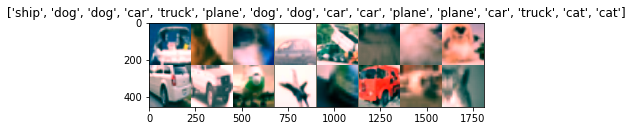

In [33]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.51, 0.224, 0.224])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(training_data['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [34]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in training_data[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [35]:
model_conv = torchvision.models.resnet18(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 10)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

#print(model_conv)

### Training the model

In [36]:
trained_model = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=20)

Epoch 0/19
----------
train Loss: 1.3898 Acc: 0.5138
val Loss: 0.8074 Acc: 0.7223

Epoch 1/19
----------
train Loss: 1.2608 Acc: 0.5630
val Loss: 0.7522 Acc: 0.7374

Epoch 2/19
----------
train Loss: 1.2432 Acc: 0.5666
val Loss: 0.7209 Acc: 0.7509

Epoch 3/19
----------
train Loss: 1.2329 Acc: 0.5680
val Loss: 0.7418 Acc: 0.7468

Epoch 4/19
----------
train Loss: 1.2246 Acc: 0.5749
val Loss: 0.7410 Acc: 0.7406

Epoch 5/19
----------
train Loss: 1.2166 Acc: 0.5758
val Loss: 0.7459 Acc: 0.7398

Epoch 6/19
----------
train Loss: 1.2175 Acc: 0.5740
val Loss: 0.7590 Acc: 0.7354

Epoch 7/19
----------
train Loss: 1.1792 Acc: 0.5903
val Loss: 0.7052 Acc: 0.7587

Epoch 8/19
----------
train Loss: 1.1692 Acc: 0.5947
val Loss: 0.6872 Acc: 0.7648

Epoch 9/19
----------
train Loss: 1.1719 Acc: 0.5921
val Loss: 0.7004 Acc: 0.7574

Epoch 10/19
----------
train Loss: 1.1591 Acc: 0.5950
val Loss: 0.6961 Acc: 0.7619

Epoch 11/19
----------
train Loss: 1.1708 Acc: 0.5924
val Loss: 0.6803 Acc: 0.7664

Ep

In [40]:
def validation(model, testloader):
    model.eval()
    test_loss = 0
    running_corrects = 0
    
    for inputs, labels in testloader:
        inputs = inputs.to('cuda')
        labels = labels.to(device)
        outputs = model.forward(inputs)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data)
    
    test_acc = running_corrects.double() / 10000

    return test_acc

In [41]:
accuracy = validation(trained_model,test_load)
print('Test Accuray: ',accuracy.item())


Test Accuray:  0.6217


In [52]:
def Top_Correct(model, num_images=25,out=1):
    images_so_far = 0
    fig = plt.figure()

    for b in range(1000): 
        data = next(iter(test_load))
        inputs, labels = data
        inputs, labels = inputs.cuda(), labels.cuda()

        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)
        b += 1
        for a in range(5):
            if preds[a] == out:
            
                print('predicted: {}'.format(class_names[preds[a]]))
                imshow(torchvision.utils.make_grid(inputs.cpu().data[a]))
                images_so_far += 1

            if images_so_far == num_images:
                    return  
                
def Top_Incorrect(model, num_images=25,out=1):
    images_so_far = 0
    fig = plt.figure()

    for b in range(1000): 
        data = next(iter(test_load))
        inputs, labels = data
        inputs, labels = inputs.cuda(), labels.cuda()

        outputs = model(inputs)
        _, preds = torch.min(outputs.data, 1)
        b += 1
        for a in range(5):
            if preds[a] == out:
            
                print('predicted: {}'.format(class_names[preds[a]]))
                imshow(torchvision.utils.make_grid(inputs.cpu().data[a]))
                images_so_far += 1

            if images_so_far == num_images:
                    return    

Top correct predictions for class: plane
predicted: plane


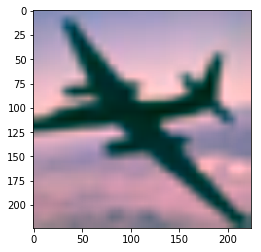

predicted: plane


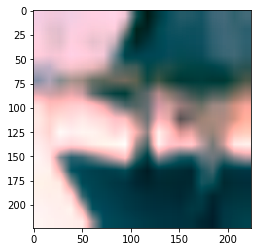

predicted: plane


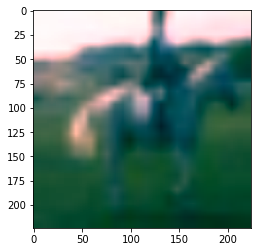

predicted: plane


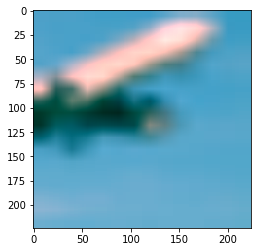

predicted: plane


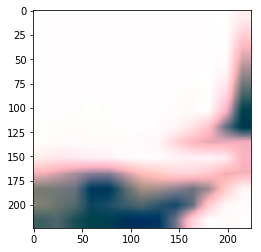

Top Incorrect predictions for class: plane
predicted: plane


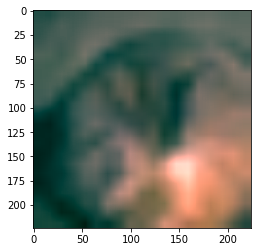

predicted: plane


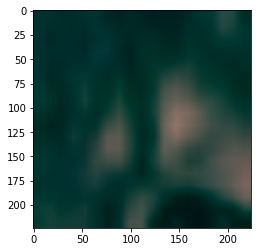

predicted: plane


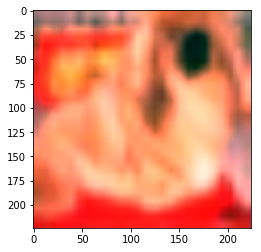

predicted: plane


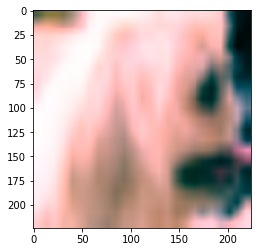

predicted: plane


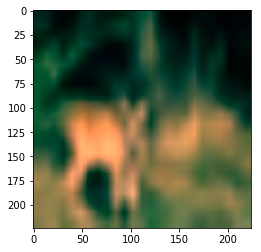

Top correct predictions for class: car
predicted: car


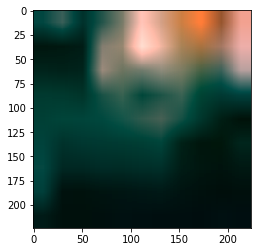

predicted: car


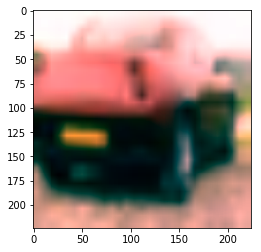

predicted: car


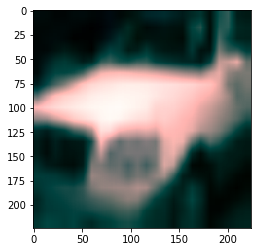

predicted: car


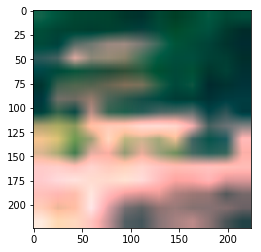

predicted: car


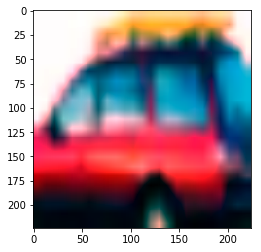

Top Incorrect predictions for class: car
predicted: car


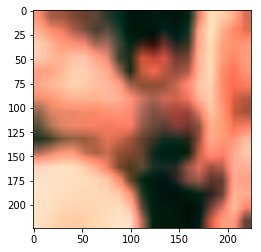

predicted: car


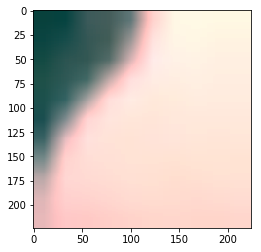

predicted: car


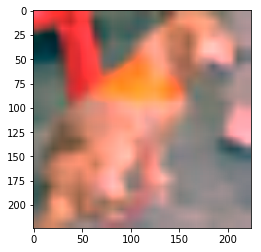

predicted: car


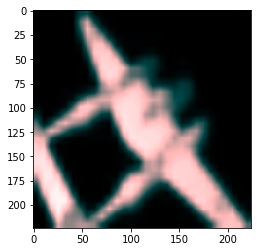

predicted: car


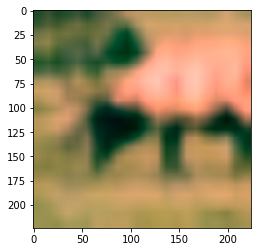

Top correct predictions for class: bird
predicted: bird


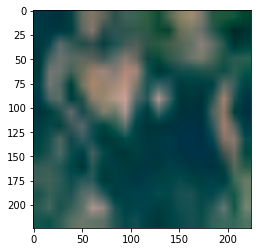

predicted: bird


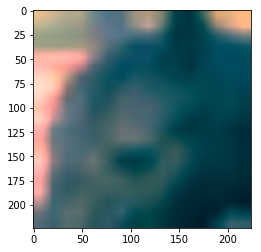

predicted: bird


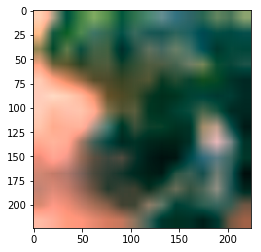

predicted: bird


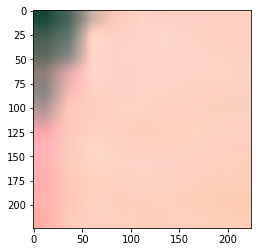

predicted: bird


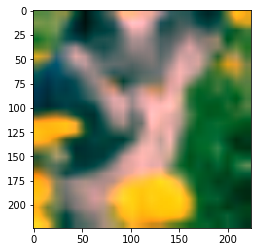

Top Incorrect predictions for class: bird
predicted: bird


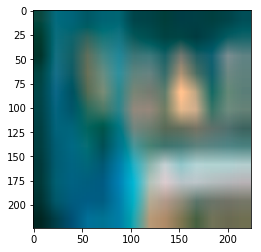

predicted: bird


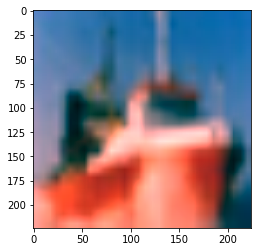

predicted: bird


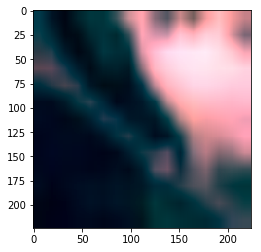

predicted: bird


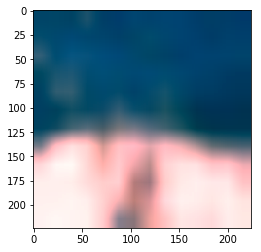

predicted: bird


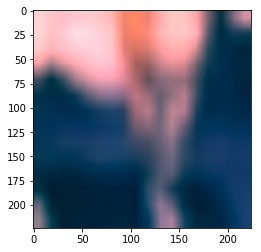

Top correct predictions for class: cat
predicted: cat


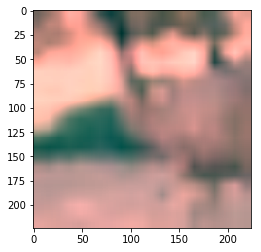

predicted: cat


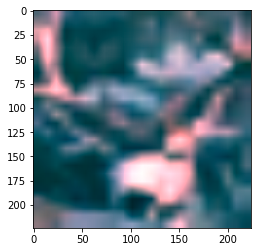

predicted: cat


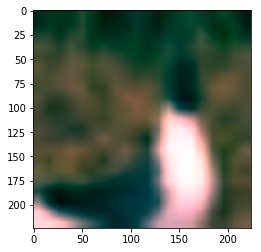

predicted: cat


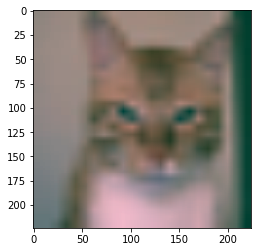

predicted: cat


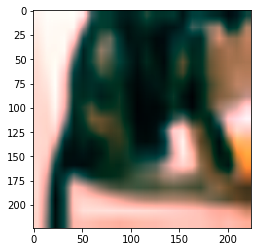

Top Incorrect predictions for class: cat
predicted: cat


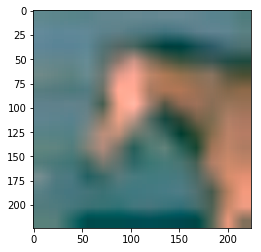

predicted: cat


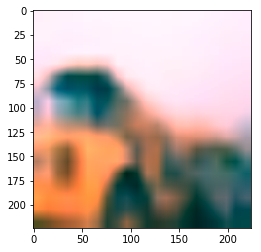

predicted: cat


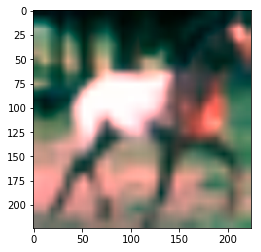

predicted: cat


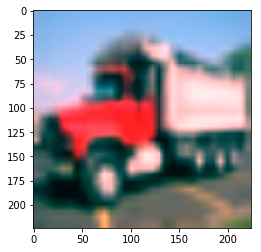

predicted: cat


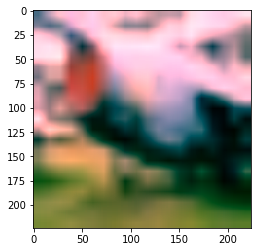

Top correct predictions for class: deer
predicted: deer


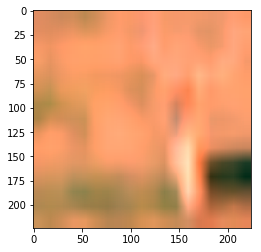

predicted: deer


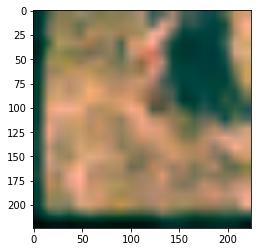

predicted: deer


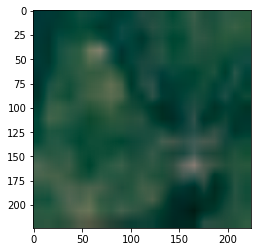

predicted: deer


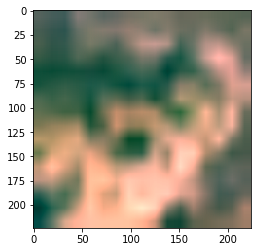

predicted: deer


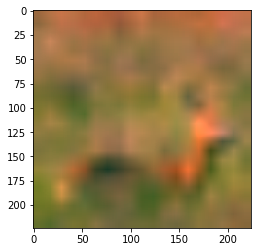

Top Incorrect predictions for class: deer
predicted: deer


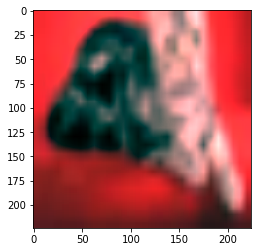

predicted: deer


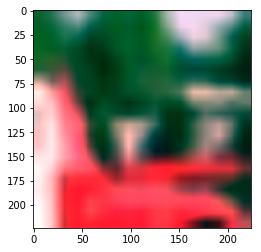

predicted: deer


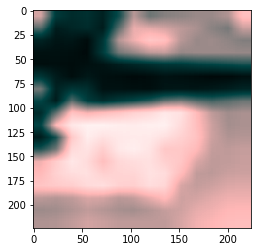

predicted: deer


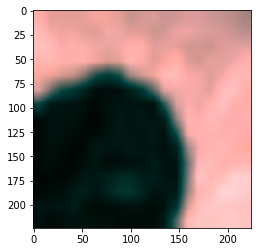

predicted: deer


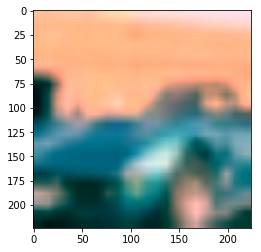

Top correct predictions for class: dog
predicted: dog


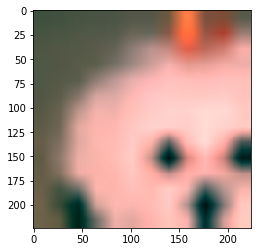

predicted: dog


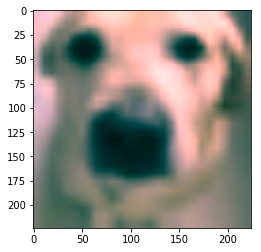

predicted: dog


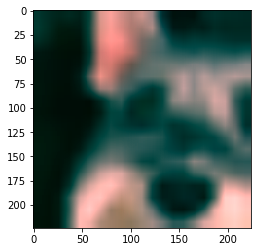

predicted: dog


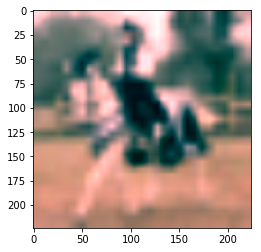

predicted: dog


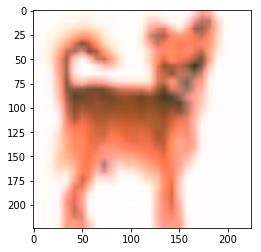

Top Incorrect predictions for class: dog
predicted: dog


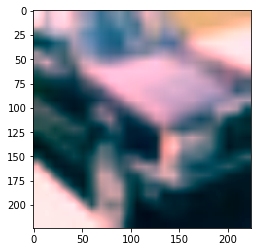

predicted: dog


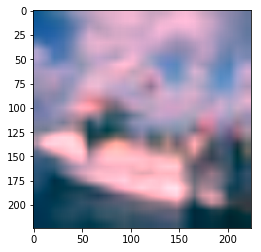

predicted: dog


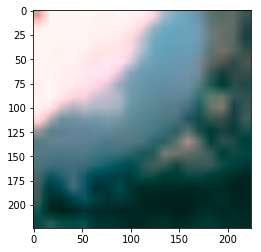

predicted: dog


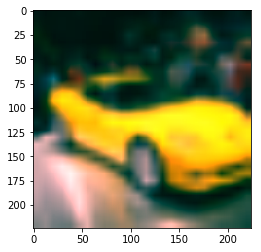

predicted: dog


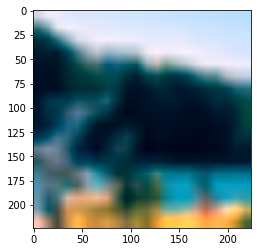

Top correct predictions for class: frog
predicted: frog


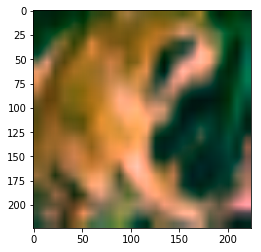

predicted: frog


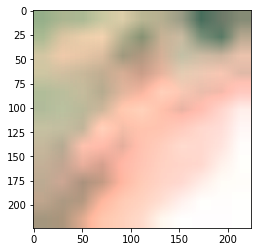

predicted: frog


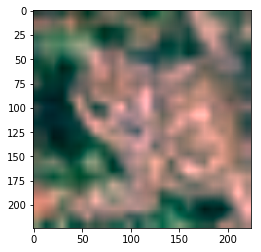

predicted: frog


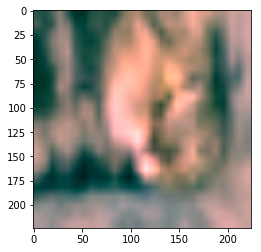

predicted: frog


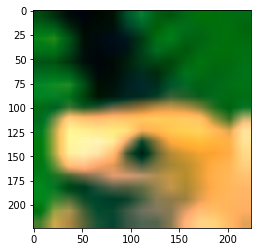

Top Incorrect predictions for class: frog
predicted: frog


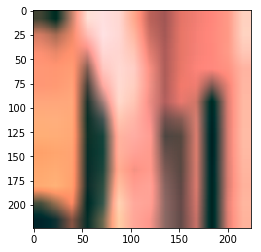

predicted: frog


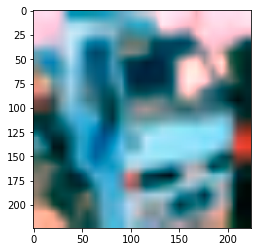

predicted: frog


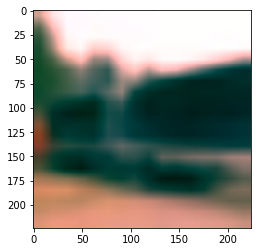

predicted: frog


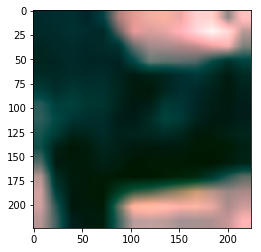

predicted: frog


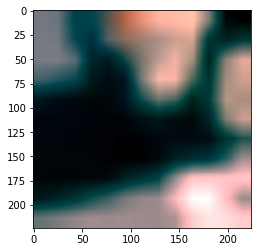

Top correct predictions for class: horse
predicted: horse


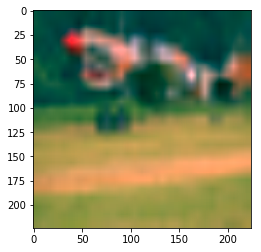

predicted: horse


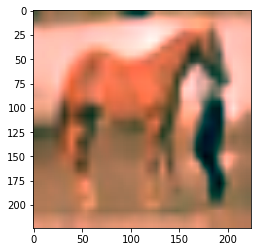

predicted: horse


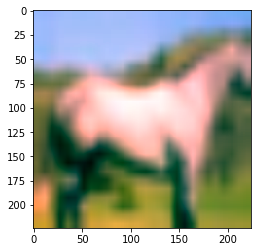

predicted: horse


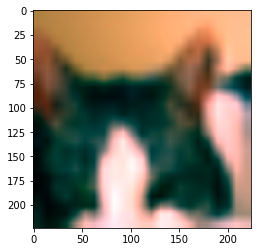

predicted: horse


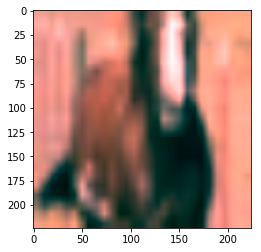

Top Incorrect predictions for class: horse
predicted: horse


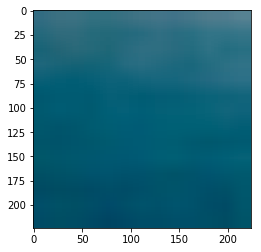

predicted: horse


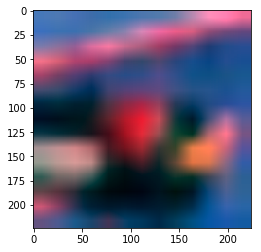

predicted: horse


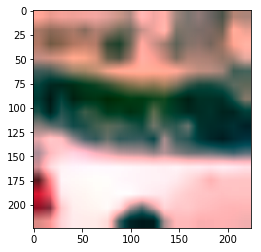

predicted: horse


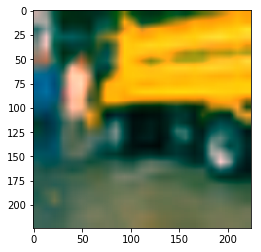

predicted: horse


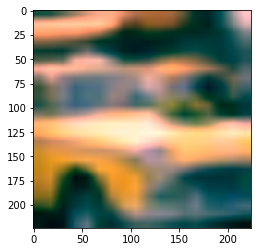

Top correct predictions for class: ship
predicted: ship


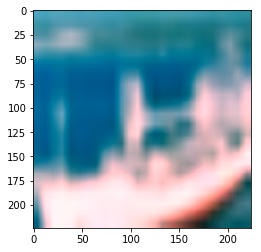

predicted: ship


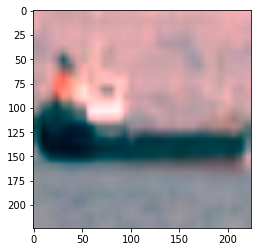

predicted: ship


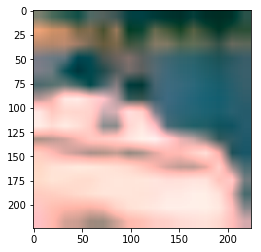

predicted: ship


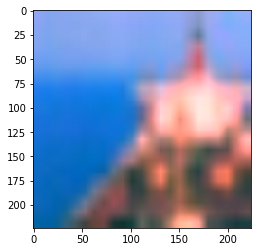

predicted: ship


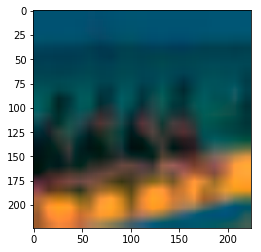

Top Incorrect predictions for class: ship
predicted: ship


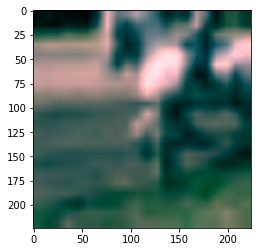

predicted: ship


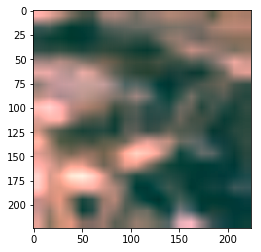

predicted: ship


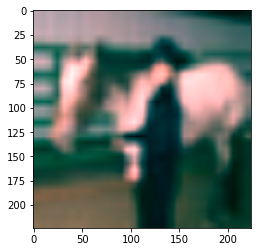

predicted: ship


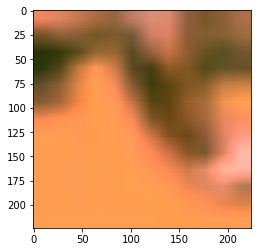

predicted: ship


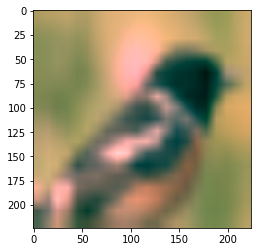

Top correct predictions for class: truck
predicted: truck


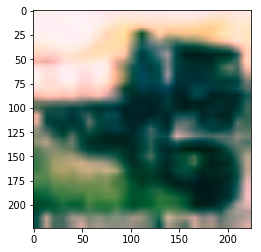

predicted: truck


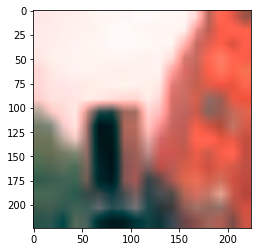

predicted: truck


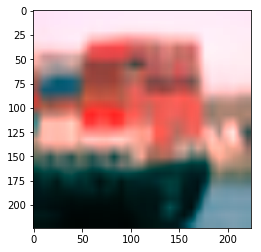

predicted: truck


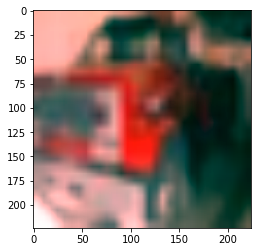

predicted: truck


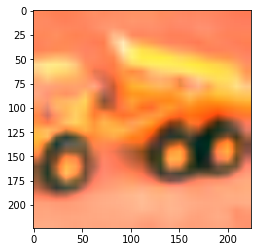

Top Incorrect predictions for class: truck
predicted: truck


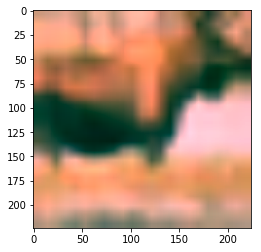

predicted: truck


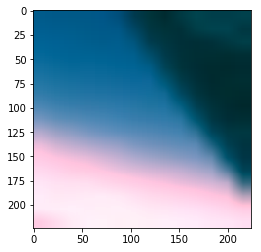

predicted: truck


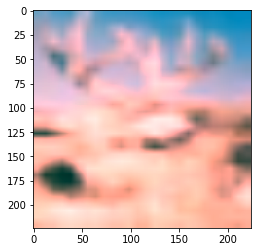

predicted: truck


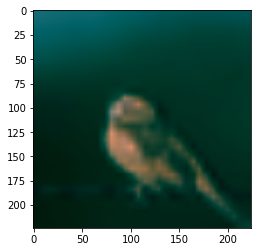

predicted: truck


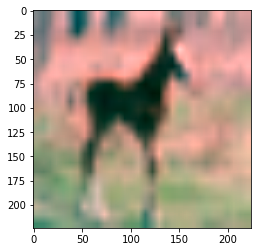

In [53]:
for i in range(10):
    print('Top correct predictions for class: {}'.format(class_names[i]))
    Top_Correct(trained_model,num_images=5,out=i)
    print('Top Incorrect predictions for class: {}'.format(class_names[i]))
    Top_Incorrect(trained_model,num_images=5,out=i)

### Tuning the model

In [43]:
model_conv_tuned = torchvision.models.resnet18(pretrained=True)
lt=8
cntr=0

for child in model_conv_tuned.children():
    cntr+=1

    if cntr < lt:
        for param in child.parameters():
            param.requires_grad = False
            
num_ftrs = model_conv_tuned.fc.in_features
model_conv_tuned.fc = nn.Linear(num_ftrs, 10)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_conv_tuned = model_conv_tuned.to(device)

criterion = nn.CrossEntropyLoss()

optimizer_conv_tuned = optim.SGD(filter(lambda p: p.requires_grad, model_conv_tuned.parameters()), lr=0.001, momentum=0.9)


# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler_tuned = lr_scheduler.StepLR(optimizer_conv_tuned, step_size=7, gamma=0.1)

### Training parameters for the model

In [44]:
trained_model_tuned = train_model(model_conv_tuned, criterion, optimizer_conv_tuned,
                         exp_lr_scheduler_tuned, num_epochs=20)

Epoch 0/19
----------
train Loss: 1.0997 Acc: 0.6106
val Loss: 0.4526 Acc: 0.8402

Epoch 1/19
----------
train Loss: 0.8970 Acc: 0.6887
val Loss: 0.3799 Acc: 0.8673

Epoch 2/19
----------
train Loss: 0.8224 Acc: 0.7148
val Loss: 0.3430 Acc: 0.8824

Epoch 3/19
----------
train Loss: 0.7736 Acc: 0.7291
val Loss: 0.3184 Acc: 0.8872

Epoch 4/19
----------
train Loss: 0.7481 Acc: 0.7412
val Loss: 0.3129 Acc: 0.8902

Epoch 5/19
----------
train Loss: 0.7200 Acc: 0.7516
val Loss: 0.2943 Acc: 0.8982

Epoch 6/19
----------
train Loss: 0.6965 Acc: 0.7579
val Loss: 0.2919 Acc: 0.8986

Epoch 7/19
----------
train Loss: 0.6458 Acc: 0.7773
val Loss: 0.2543 Acc: 0.9119

Epoch 8/19
----------
train Loss: 0.6164 Acc: 0.7839
val Loss: 0.2525 Acc: 0.9093

Epoch 9/19
----------
train Loss: 0.6166 Acc: 0.7865
val Loss: 0.2482 Acc: 0.9133

Epoch 10/19
----------
train Loss: 0.6055 Acc: 0.7904
val Loss: 0.2433 Acc: 0.9140

Epoch 11/19
----------
train Loss: 0.6101 Acc: 0.7903
val Loss: 0.2422 Acc: 0.9139

Ep

In [46]:
accuracy = validation(trained_model_tuned,test_load)
print(accuracy.item())

0.7928000000000001


Top correct predictions for class: plane
predicted: plane


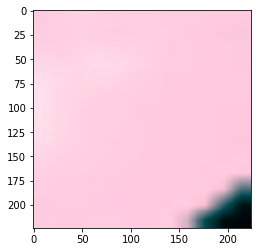

predicted: plane


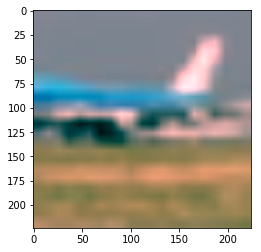

predicted: plane


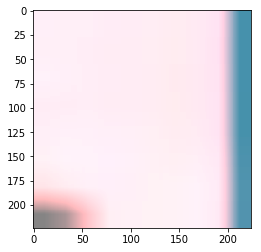

predicted: plane


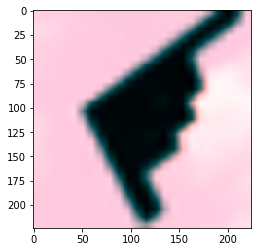

predicted: plane


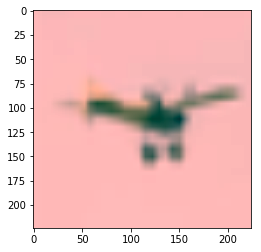

Top Incorrect predictions for class: plane
predicted: plane


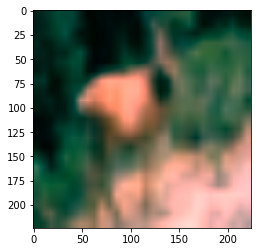

predicted: plane


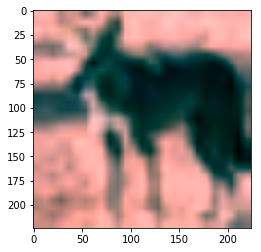

predicted: plane


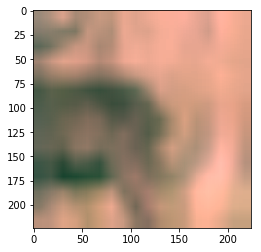

predicted: plane


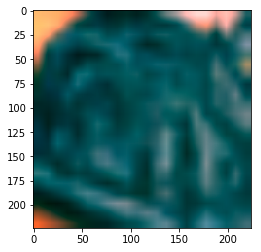

predicted: plane


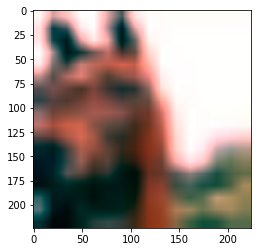

Top correct predictions for class: car
predicted: car


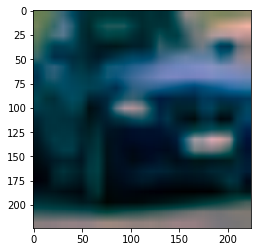

predicted: car


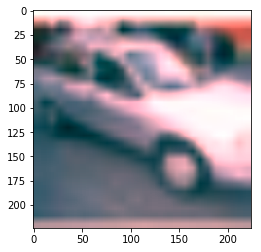

predicted: car


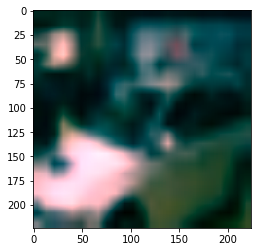

predicted: car


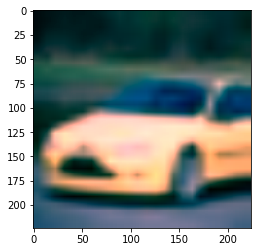

predicted: car


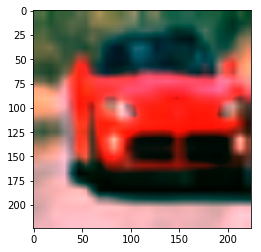

Top Incorrect predictions for class: car
predicted: car


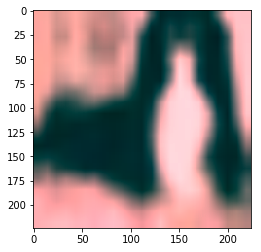

predicted: car


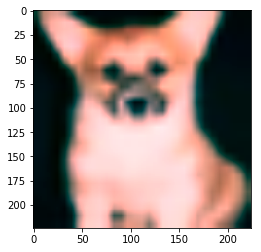

predicted: car


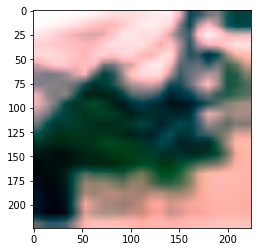

predicted: car


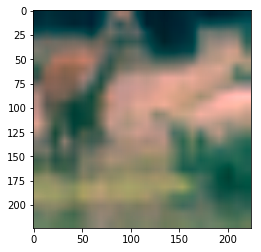

predicted: car


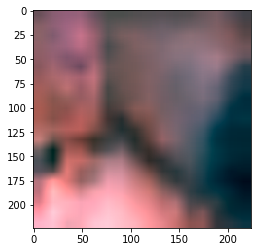

Top correct predictions for class: bird
predicted: bird


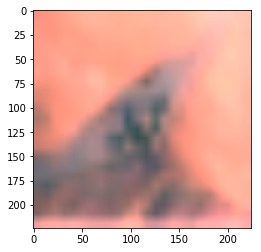

predicted: bird


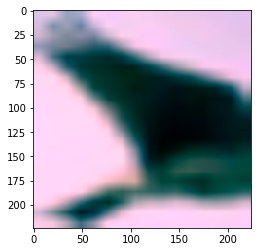

predicted: bird


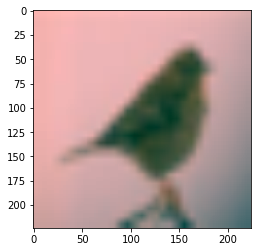

predicted: bird


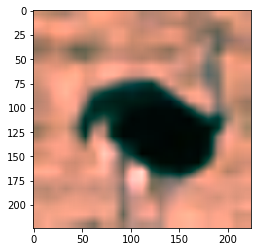

predicted: bird


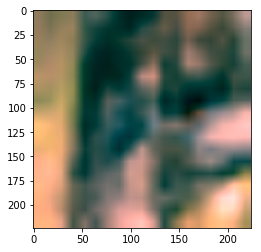

Top Incorrect predictions for class: bird
predicted: bird


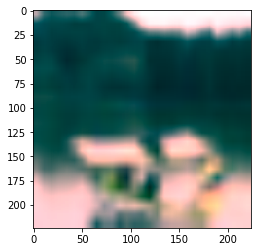

predicted: bird


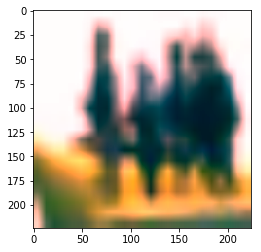

predicted: bird


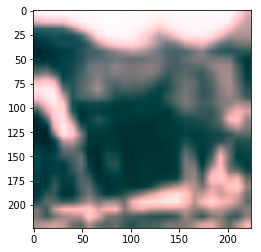

predicted: bird


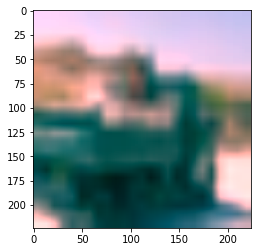

predicted: bird


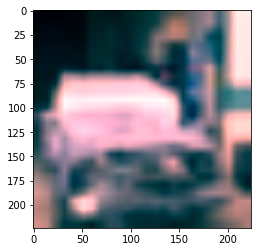

Top correct predictions for class: cat
predicted: cat


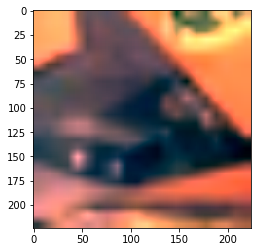

predicted: cat


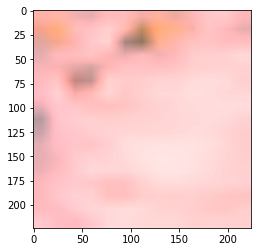

predicted: cat


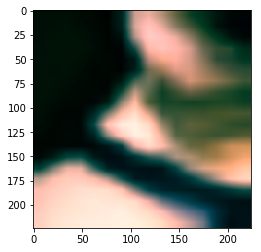

predicted: cat


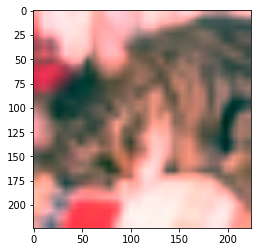

predicted: cat


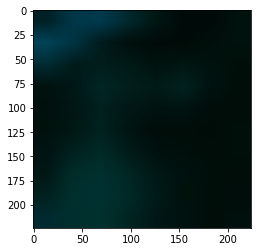

Top Incorrect predictions for class: cat
predicted: cat


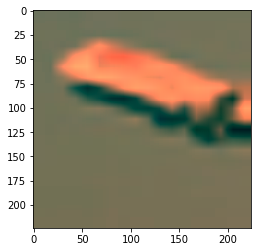

predicted: cat


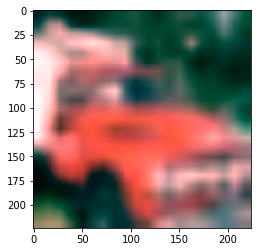

predicted: cat


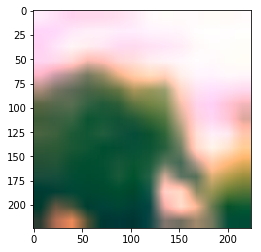

predicted: cat


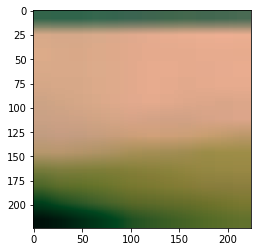

predicted: cat


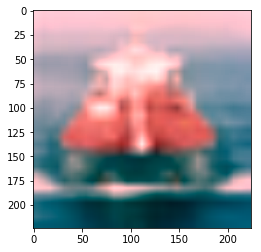

Top correct predictions for class: deer
predicted: deer


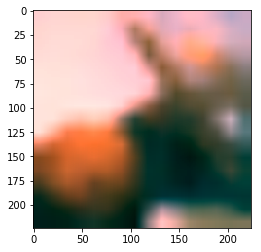

predicted: deer


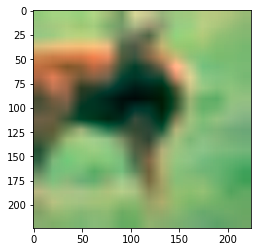

predicted: deer


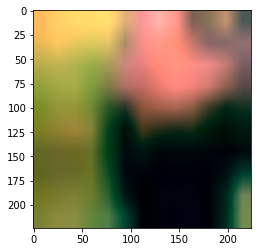

predicted: deer


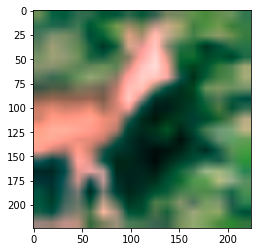

predicted: deer


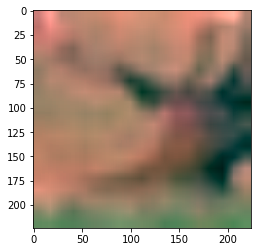

Top Incorrect predictions for class: deer
predicted: deer


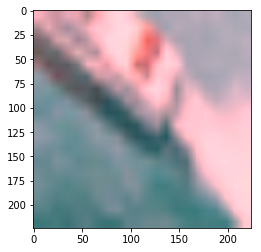

predicted: deer


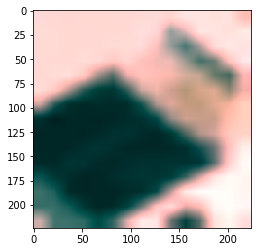

predicted: deer


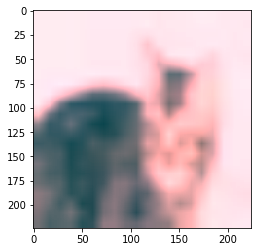

predicted: deer


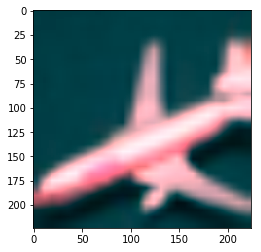

predicted: deer


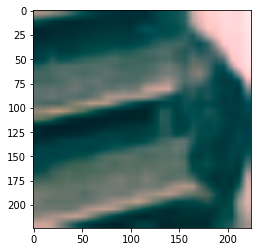

Top correct predictions for class: dog
predicted: dog


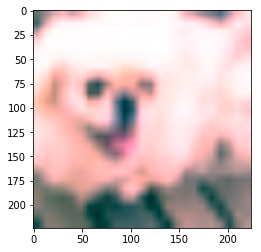

predicted: dog


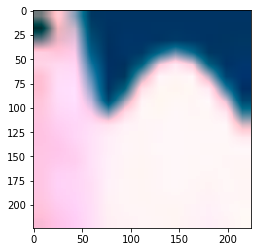

predicted: dog


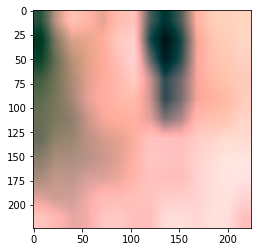

predicted: dog


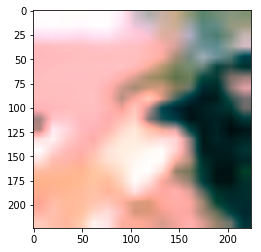

predicted: dog


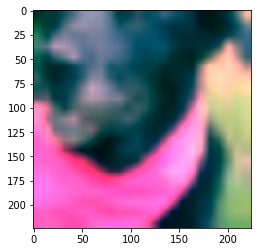

Top Incorrect predictions for class: dog
predicted: dog


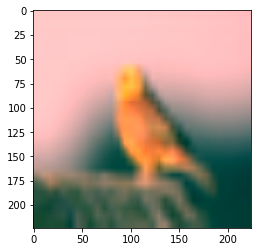

predicted: dog


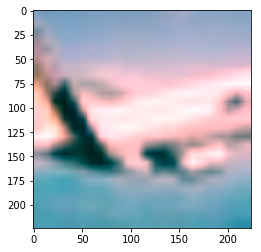

predicted: dog


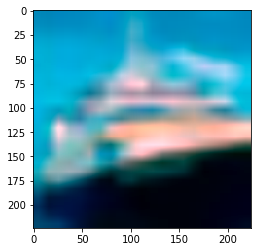

predicted: dog


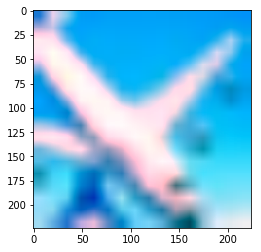

predicted: dog


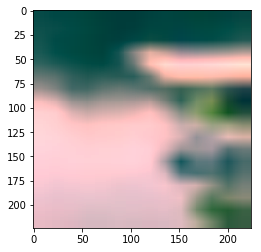

Top correct predictions for class: frog
predicted: frog


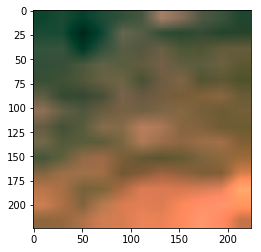

predicted: frog


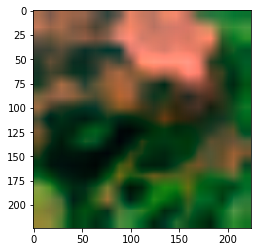

predicted: frog


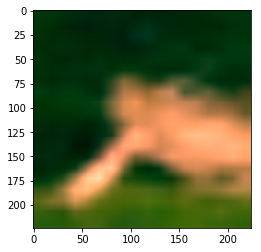

predicted: frog


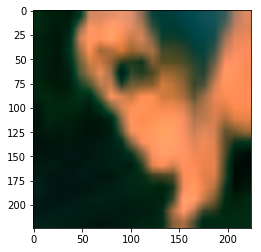

predicted: frog


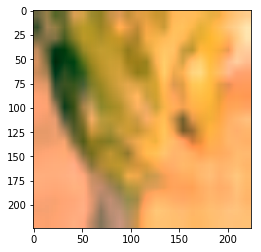

Top Incorrect predictions for class: frog
predicted: frog


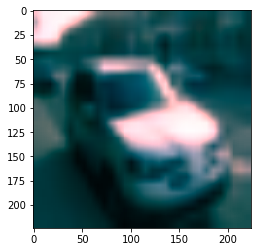

predicted: frog


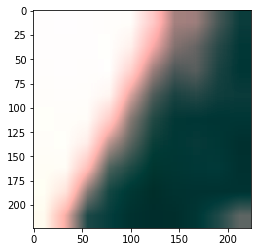

predicted: frog


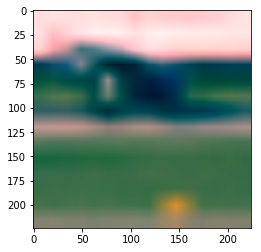

predicted: frog


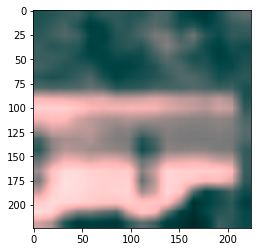

predicted: frog


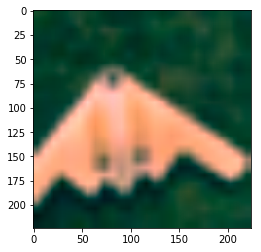

Top correct predictions for class: horse
predicted: horse


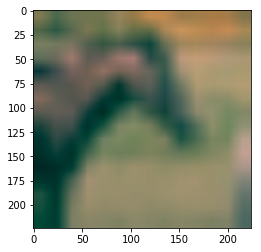

predicted: horse


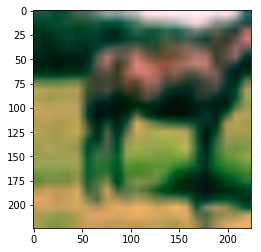

predicted: horse


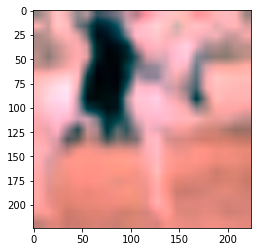

predicted: horse


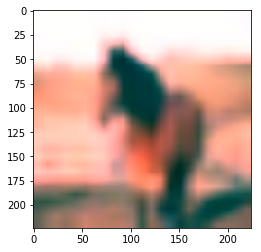

predicted: horse


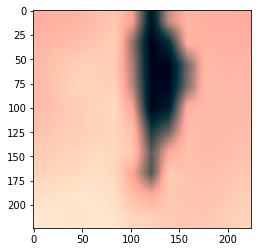

Top Incorrect predictions for class: horse
predicted: horse


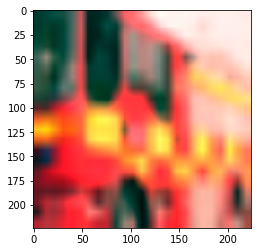

predicted: horse


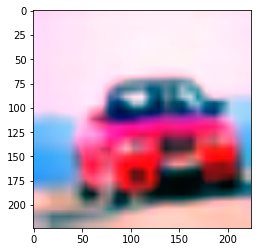

predicted: horse


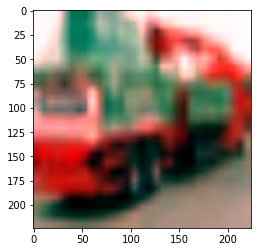

predicted: horse


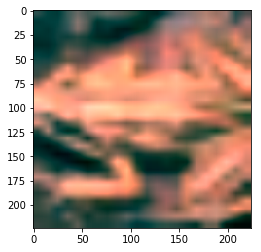

predicted: horse


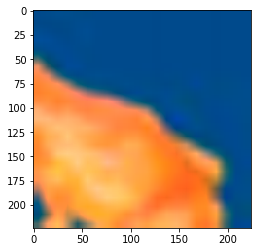

Top correct predictions for class: ship
predicted: ship


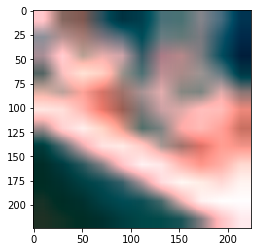

predicted: ship


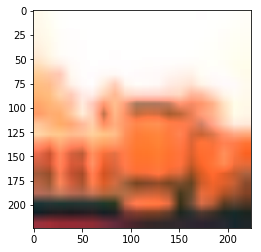

predicted: ship


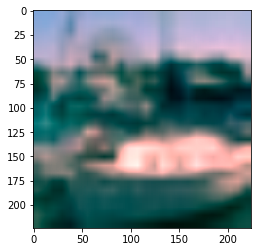

predicted: ship


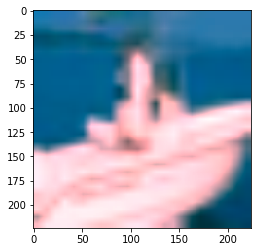

predicted: ship


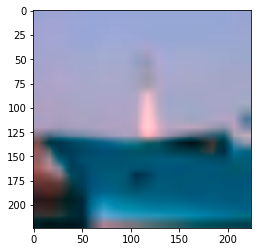

Top Incorrect predictions for class: ship
predicted: ship


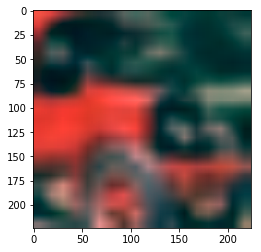

predicted: ship


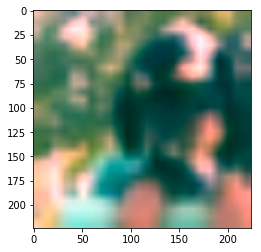

predicted: ship


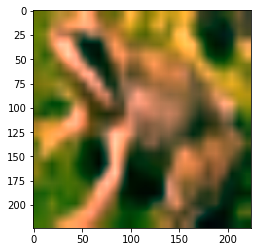

predicted: ship


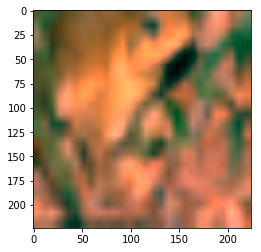

predicted: ship


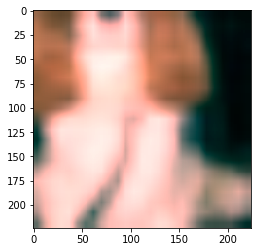

Top correct predictions for class: truck
predicted: truck


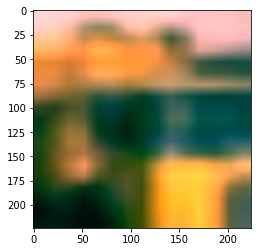

predicted: truck


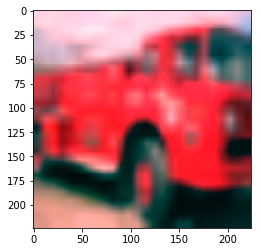

predicted: truck


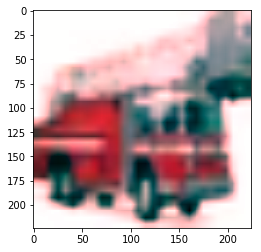

predicted: truck


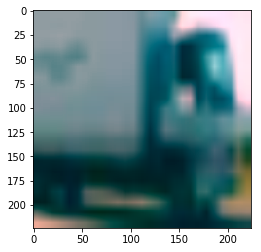

predicted: truck


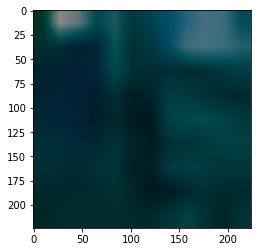

Top Incorrect predictions for class: truck
predicted: truck


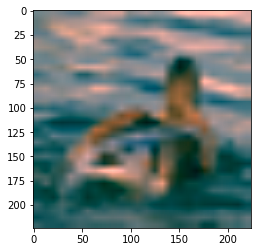

predicted: truck


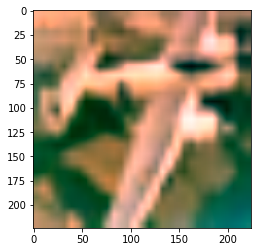

predicted: truck


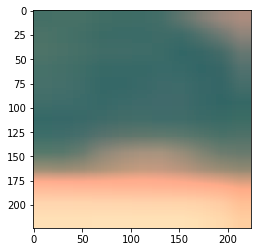

predicted: truck


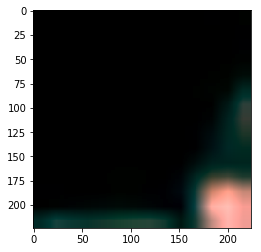

predicted: truck


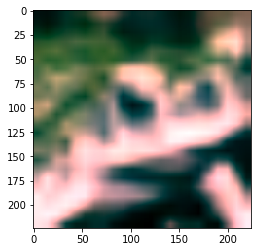

In [54]:
for i in range(10):
    print('Top correct predictions for class: {}'.format(class_names[i]))
    Top_Correct(trained_model_tuned,num_images=5,out=i)
    print('Top Incorrect predictions for class: {}'.format(class_names[i]))
    Top_Incorrect(trained_model_tuned,num_images=5,out=i)